# Explore here

In [1]:
from google.colab import drive, files
from pathlib import Path
import os  # Para operaciones de sistema de archivos
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing import image
import shutil
import random
import seaborn as sns
import pandas as pd
from keras.preprocessing.image import ImageDataGenerator    # Para procesamiento de imágenes
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, MaxPool2D , Flatten
from keras.optimizers import Adam
from keras.callbacks import Callback, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard, CSVLogger
from keras.metrics import Precision, Recall, F1Score, AUC
import tensorboard
from keras.models import load_model
from keras.applications import VGG16

In [2]:
print(tf.__version__)

2.15.0


In [3]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Fri May 31 12:00:12 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   43C    P8              12W /  72W |      1MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [4]:
# GPU test de Google Colab
print("GPU disponible: ", tf.config.list_physical_devices('GPU'))

GPU disponible:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [5]:
#Montamos Drive y marcamos las rutas a las carpetas de imágenes.
drive.mount ('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
data = Path('/content/drive/MyDrive/train')

In [ ]:
# Cargar el conjunto de datos
data = '/content/drive/MyDrive/Proyecto DogCat/train'

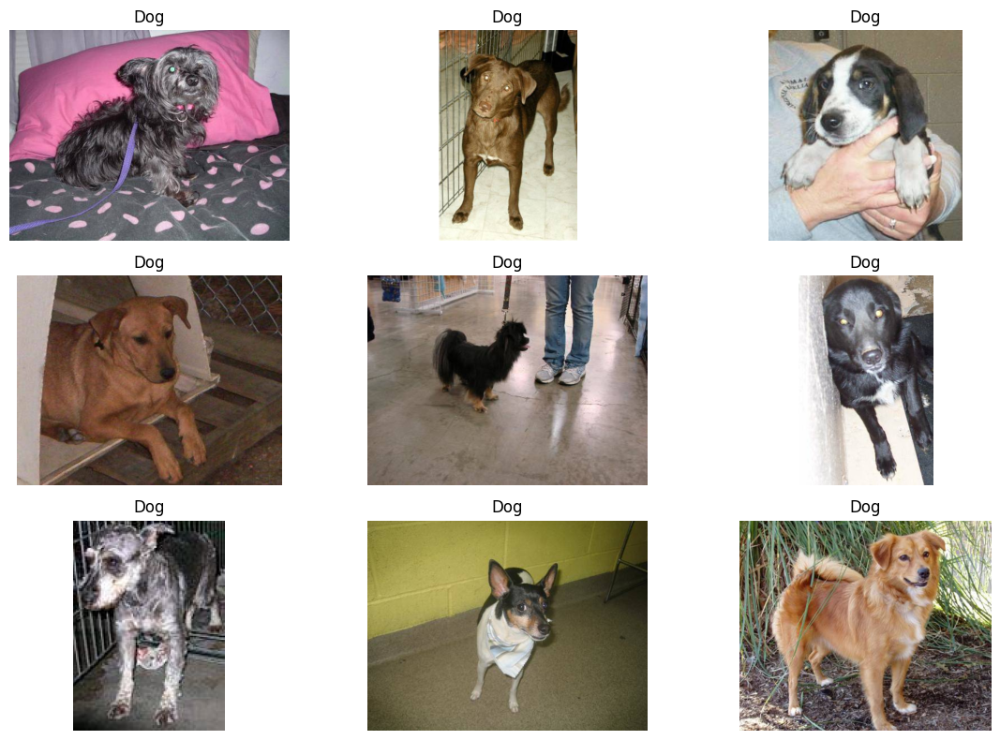

In [ ]:

archivos_imagen = os.listdir(data)  # lista de todos los nombres de archivos de imagen de perro en la carpeta especificada

archivos_imagen_dog = [f for f in archivos_imagen if 'dog' in f]  # Filtrar los nombres de los archivos para incluir solo los que contienen 'dog'

archivos_imagen_dog = sorted(archivos_imagen_dog)[:9]  # # Ordena los nombres de archivos para obtener las primeras 9 imágenes de perros

dog_images = []   # lista vacía llamada dog_images para almacenar las imágenes de perro

for filename in archivos_imagen_dog:
    # ruta completa del archivo de imagen:
    img_path = os.path.join(data, filename)  # os.path.join() une la ruta de la carpeta de perros con el nombre de archivo de imagen
    img = image.load_img(img_path)  # mage.load_img() carga la imagen como un objeto PIL.Image.
    img_array = image.img_to_array(img)  # La imagen se convierte en un array NumPy, lo que permite su manipulación y procesamiento posterior
    img_array /= 255.0  # Se normalizan los valores de píxeles de la imagen dividiendo cada valor de píxel por 255.0 para ajustarlos al rango [0, 1].
    dog_images.append(img_array)


plt.figure(figsize=(12, 8))

# itera sobre las nueve imágenes en la lista dog_images en un bucle for:
for i in range(9):
    plt.subplot(3, 3, i + 1)  # plt.subplot() para definir la posición de la subtrama dentro de la figura general. En este caso, se utiliza una cuadrícula de 3x3, por lo que hay nueve subtramas en total.
    plt.imshow(dog_images[i])
    plt.title('Dog')
    plt.axis('off')  # Se desactivan los ejes utilizando plt.axis('off') para eliminar los números de los ejes x e y.

# Adjust Layout
plt.tight_layout()

# Show the pictures
plt.show()

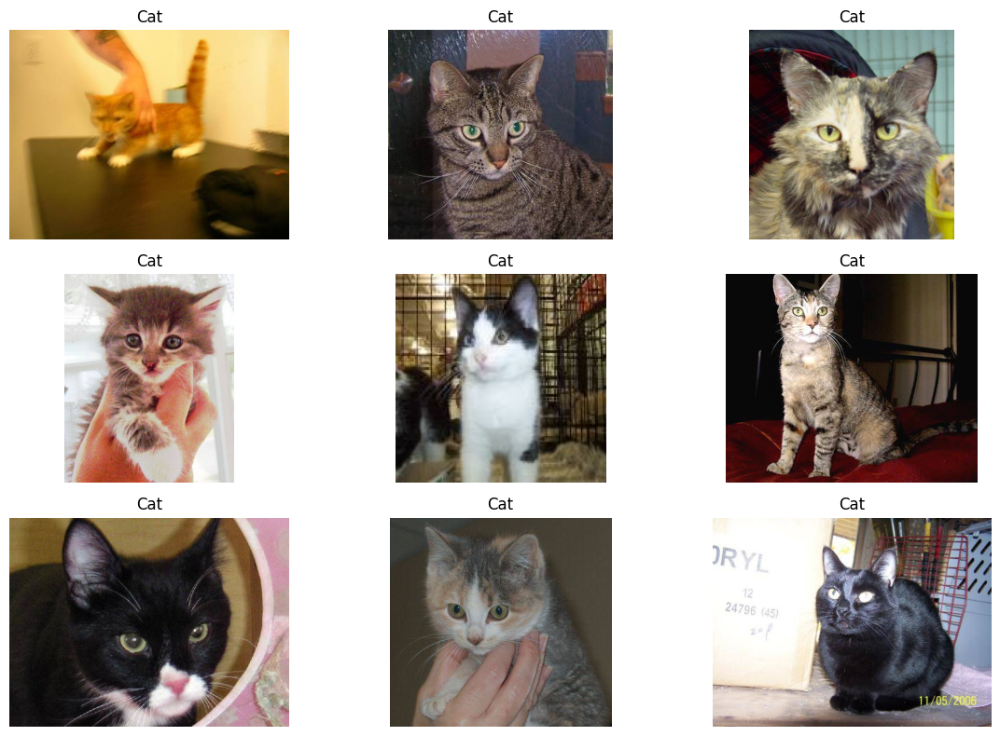

In [ ]:

archivos_imagen_cat = [f for f in archivos_imagen if 'cat' in f]  # Filtrar los nombres de los archivos para incluir solo los que contienen 'dog'

archivos_imagen_cat = sorted(archivos_imagen_cat)[:9]  # # Ordena los nombres de archivos para obtener las primeras 9 imágenes de gatos

cat_images = []   # lista vacía llamada dog_images para almacenar las imágenes de gatos

for file_name in archivos_imagen_cat:
    # ruta completa del archivo de imagen:
    imag_path = os.path.join(data, file_name)  # os.path.join() une la ruta de la carpeta de gatos con el nombre de archivo de imagen
    imag = image.load_img(imag_path)  # mage.load_img() carga la imagen como un objeto PIL.Image.
    imag_array = image.img_to_array(imag)  # La imagen se convierte en un array NumPy, lo que permite su manipulación y procesamiento posterior
    imag_array /= 255.0  # Se normalizan los valores de píxeles de la imagen dividiendo cada valor de píxel por 255.0 para ajustarlos al rango [0, 1].
    cat_images.append(imag_array)


plt.figure(figsize=(12, 8))

# itera sobre las nueve imágenes en la lista cat_images en un bucle for:
for i in range(9):
    plt.subplot(3, 3, i + 1)  # plt.subplot() para definir la posición de la subtrama dentro de la figura general. En este caso, se utiliza una cuadrícula de 3x3, por lo que hay nueve subtramas en total.
    plt.imshow(cat_images[i])
    plt.title('Cat')
    plt.axis('off')  # Se desactivan los ejes utilizando plt.axis('off') para eliminar los números de los ejes x e y.

# Adjust Layout
plt.tight_layout()

# Show the pictures
plt.show()

In [ ]:

# Lista todos los archivos en la carpeta
files = os.listdir(data)

# Cuenta el número de archivos que tienen una extensión de imagen válida
num_images = sum(1 for file in files if file.endswith(('.jpg')))

print("Número total de imágenes:", num_images)

Número total de imágenes: 25000


In [ ]:
import shutil  # proporciona operaciones de alto nivel para trabajar con archivos y directorios (por ejemplo, mover archivos)

# Ruta del directorio principal que contiene todas las imágenes
directorio_principal = "/content/drive/MyDrive/Proyecto DogCat/train"

# Crea los directorios 'dog' y 'cat' dentro del directorio principal
os.makedirs(os.path.join(directorio_principal, "dog"), exist_ok=True) # os.makedirs() Crea los subdirectorios dentro del directorio principal
os.makedirs(os.path.join(directorio_principal, "cat"), exist_ok=True)  # os.path.join() unie las partes de la ruta de manera segura
# exist_ok=True garantiza que no se genere un error si los directorios ya existen

# Itera sobre todos los archivos en el directorio principal
for filename in os.listdir(directorio_principal):  # utilizando os.listdir() proporciona una lista de todos los archivos y directorios en el directorio especificado.
    # Verifica si el archivo es una imagen de perro
    if "dog" in filename:
        # Mueve la imagen de perro al subdirectorio 'dog'
        shutil.move(os.path.join(directorio_principal, filename), os.path.join(directorio_principal, "dog"))  # shutil.move() mueve la imagen de perro al subdirectorio "dog"
    # Verifica si el archivo es una imagen de gato
    elif "cat" in filename:
        # Mueve la imagen de gato al subdirectorio 'cat'
        shutil.move(os.path.join(directorio_principal, filename), os.path.join(directorio_principal, "cat"))

<ipython-input-12-5c21e03dd068>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Class', y='Count', data=df_counts, ax=ax, palette='viridis')


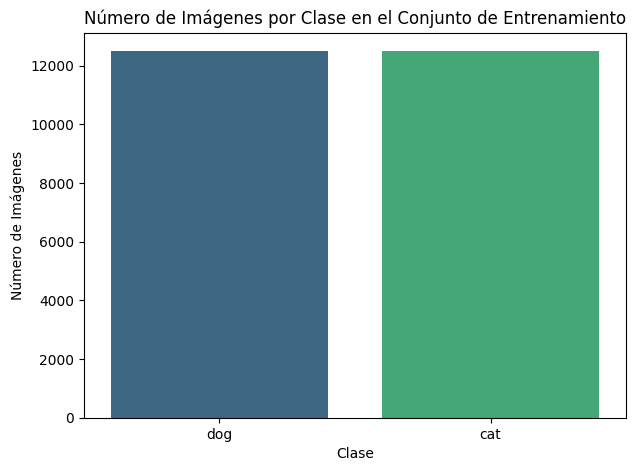

In [ ]:
# Directorio de entrenamiento
train_dir = '/content/drive/MyDrive/Proyecto DogCat/train'

# Lista de clases
classes = ['dog', 'cat']

# Contar el número de imágenes en cada subdirectorio
image_counts = {}
for cls in classes:
    cls_dir = os.path.join(train_dir, cls)
    if os.path.exists(cls_dir):
        image_counts[cls] = len(os.listdir(cls_dir))
    else:
        image_counts[cls] = 0

# Crear un DataFrame para la visualización
import pandas as pd
df_counts = pd.DataFrame(list(image_counts.items()), columns=['Class', 'Count'])

# Crear la gráfica
fig, ax = plt.subplots(figsize=(7, 5))
sns.barplot(x='Class', y='Count', data=df_counts, ax=ax, palette='viridis')
ax.set_title('Número de Imágenes por Clase en el Conjunto de Entrenamiento')
ax.set_xlabel('Clase')
ax.set_ylabel('Número de Imágenes')
plt.show()

In [ ]:
# Establecer la semilla aleatoria
random.seed(42)

train_dir = '/content/drive/MyDrive/Proyecto DogCat/train'
validation_dir = '/content/drive/MyDrive/Proyecto DogCat/validation'

# Crear directorios de validación si no existen
os.makedirs(validation_dir, exist_ok=True)

# Lista de clases
classes = ['dog', 'cat']

# Número total de imágenes para el conjunto de validación
num_validation_images = 5000

# Iterar sobre las clases
for cls in classes:
    # Rutas de los directorios de entrenamiento y validación para esta clase
    train_cls_dir = os.path.join(train_dir, cls)
    validation_cls_dir = os.path.join(validation_dir, cls)

    # Crear directorios de validación por clase si no existen
    os.makedirs(validation_cls_dir, exist_ok=True)

    # Obtener una lista de nombres de archivo de imágenes para esta clase
    images = os.listdir(train_cls_dir)

    # Seleccionar aleatoriamente num_validation_images de imágenes
    selected_images = random.sample(images, num_validation_images // len(classes))

    # Mover las imágenes seleccionadas al directorio de validación
    for image in selected_images:
        src = os.path.join(train_cls_dir, image)
        dst = os.path.join(validation_cls_dir, image)
        shutil.move(src, dst)

In [ ]:
train_dir = '/content/drive/MyDrive/Proyecto DogCat/train'

# Crea un objeto ImageDataGenerator:

datagen = ImageDataGenerator(rescale=1./255)

# Carga los datos de entrenamiento progresivamente:

batch_size = 30
train_data = datagen.flow_from_directory(
    train_dir,
    target_size= (224, 224),  # Redimensiona las imágenes a 200x200 píxeles
    batch_size= batch_size,
    classes = ["dog", "cat"]) # Modo de clasificación binaria

Found 20000 images belonging to 2 classes.


In [ ]:
validation_dir = '/content/drive/MyDrive/Proyecto DogCat/validation'

# Crea un objeto ImageDataGenerator:

validationgen = ImageDataGenerator(rescale=1./255)

# Carga los datos de entrenamiento progresivamente:
val_data = validationgen.flow_from_directory(
    validation_dir,
    target_size = (224, 224),  # Redimensiona las imágenes a 200x200 píxeles
    batch_size = batch_size,
    classes = ["dog", "cat"]) # Modo de clasificación binaria

Found 5000 images belonging to 2 classes.


In [ ]:
test_dir = '/content/drive/MyDrive/Proyecto DogCat/test'

# Crea un objeto ImageDataGenerator:
testgen = ImageDataGenerator(rescale=1./255)

# Carga los datos de entrenamiento progresivamente:
test_data = testgen.flow_from_directory(
    test_dir,
    target_size = (224, 224),  # Redimensiona las imágenes a 200x200 píxeles
    batch_size = batch_size,
    classes = ["test"]
    )

Found 12500 images belonging to 1 classes.


In [ ]:
model = Sequential()
model.add(Conv2D(input_shape = (224,224,3), filters = 64, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(Conv2D(filters = 64,kernel_size = (3,3),padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size = (2,2),strides = (2,2)))
model.add(Conv2D(filters = 128, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(Conv2D(filters = 128, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size = (2,2),strides = (2,2)))
model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size = (2,2),strides = (2,2)))
model.add(Conv2D(filters = 512, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(Conv2D(filters = 512, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(Conv2D(filters = 512, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size = (2,2),strides = (2,2)))
model.add(Conv2D(filters = 512, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(Conv2D(filters = 512, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(Conv2D(filters = 512, kernel_size = (3,3), padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size = (2,2),strides = (2,2)))

# Move the Data through the Dense Layers
model.add(Flatten())
model.add(Dense(units = 4096,activation = "relu"))
model.add(Dense(units = 4096,activation = "relu"))
model.add(Dense(units = 2, activation = "softmax"))

In [6]:
@keras.saving.register_keras_serializable()
class Precision(keras.metrics.Metric):
    def __init__(self, name='precision', **kwargs):
        super(Precision, self).__init__(name=name, **kwargs)
        self.true_positives = self.add_weight(name='tp', initializer='zeros')
        self.false_positives = self.add_weight(name='fp', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.round(y_pred)
        tp = tf.reduce_sum(tf.cast(y_true * y_pred, 'float32'))
        fp = tf.reduce_sum(tf.cast((1 - y_true) * y_pred, 'float32'))
        self.true_positives.assign_add(tp)
        self.false_positives.assign_add(fp)

    def result(self):
        return self.true_positives / (self.true_positives + self.false_positives + keras.backend.epsilon())

    def reset_state(self):
        self.true_positives.assign(0)
        self.false_positives.assign(0)

In [7]:
@keras.saving.register_keras_serializable()
class Recall(keras.metrics.Metric):
    def __init__(self, name='recall', **kwargs):
        super(Recall, self).__init__(name=name, **kwargs)
        self.true_positives = self.add_weight(name='tp', initializer='zeros')
        self.false_negatives = self.add_weight(name='fn', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.round(y_pred)
        tp = tf.reduce_sum(tf.cast(y_true * y_pred, 'float32'))
        fn = tf.reduce_sum(tf.cast(y_true * (1 - y_pred), 'float32'))
        self.true_positives.assign_add(tp)
        self.false_negatives.assign_add(fn)

    def result(self):
        return self.true_positives / (self.true_positives + self.false_negatives + keras.backend.epsilon())

    def reset_state(self):
        self.true_positives.assign(0)
        self.false_negatives.assign(0)


In [8]:
@keras.saving.register_keras_serializable()
class F1Score(keras.metrics.Metric):
    def __init__(self, name='f1_score', **kwargs):
        super(F1Score, self).__init__(name=name, **kwargs)
        self.precision = Precision()
        self.recall = Recall()

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.precision.update_state(y_true, y_pred)
        self.recall.update_state(y_true, y_pred)

    def result(self):
        precision = self.precision.result()
        recall = self.recall.result()
        return 2 * ((precision * recall) / (precision + recall + keras.backend.epsilon()))

    def reset_state(self):
        self.precision.reset_states()
        self.recall.reset_states()

In [9]:
@keras.saving.register_keras_serializable()
class AUC(keras.metrics.Metric):
    def __init__(self, name='auc', **kwargs):
        super(AUC, self).__init__(name=name, **kwargs)
        self.auc = tf.keras.metrics.AUC()

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.auc.update_state(y_true, y_pred, sample_weight)

    def result(self):
        return self.auc.result()

    def reset_state(self):
        self.auc.reset_states()

In [ ]:
model.compile(loss = keras.losses.categorical_crossentropy,
              optimizer = Adam(learning_rate = 0.001),
              metrics = ["accuracy", Precision(), Recall(), F1Score(), AUC()])

In [10]:
checkpoint = ModelCheckpoint(
    filepath="/content/drive/MyDrive/Proyecto DogCat/TransferVgg16_2-DogCat.keras",  # Formato de nombre de archivo con el número de la época
    monitor="val_recall",  # La métrica que se va a monitorear para decidir si guardar o no el modelo
    verbose=2,  # El nivel de detalle de los mensajes que se mostrarán durante el proceso de guardado del modelo
    save_best_only=True,  # Si se deben guardar solo los pesos del modelo que resulten en la mejor puntuación de la métrica monitoreada
    save_weights_only=False,  # Si se deben guardar solo los pesos del modelo (True) o el modelo completo (False)
    mode="max",  # Especifica si se debe maximizar ('max') o minimizar ('min') la métrica monitorizada
    save_freq="epoch"  # Guardar el modelo al final de cada época
)

In [11]:
early = EarlyStopping(monitor = "val_recall",  # métrica que se va a monitorear para decidir si se detiene el entrenamiento del modelo.
                    patience = 5, # número de épocas sin mejora después de las cuales se detendrá el entrenamiento.
                    verbose = 2,
                    mode = "max",
                    restore_best_weights=True) # especifica si se restauran los pesos del modelo al final del entrenamiento con los mejores pesos obtenidos.

In [12]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss',  # métrica que se va a monitorear para decidir si se debe reducir la tasa de aprendizaje."val_loss" para la pérdida en el conjunto de validación
                              factor=0.01, # Factor por el cual se reducirá la tasa de aprendizaje. Después de que se activa la reducción de la tasa de aprendizaje, la nueva tasa será learning_rate = learning_rate * factor.
                              patience=3,  # Número de épocas sin mejora después del cual se reducirá la tasa de aprendizaje
                              verbose = 1,
                              mode = 'min',
                              min_lr=0.00001)

In [13]:
from datetime import datetime

# Configuración de TensorBoard
log_dir = os.path.join("/content/drive/MyDrive/Proyecto DogCat/logs", "fit", datetime.now().strftime("%Y%m%d-%H%M%S"))


tensorboard = TensorBoard(log_dir=log_dir,  #  Directorio donde se guardarán los archivos de registro de TensorBoard. Los archivos de registro contienen información sobre el entrenamiento del modelo, como las métricas de rendimiento y la estructura del modelo.
                          histogram_freq=1,  # Frecuencia (en número de épocas) con la que se calcularán los histogramas de los pesos del modelo y las activaciones de las capas. Un histograma es una representación gráfica de la distribución de los valores en un conjunto de datos.
                          write_graph=True,  # Booleano que indica si se debe escribir la estructura del gráfico del modelo en los archivos de registro. Esto incluye información sobre las capas y las conexiones entre ellas.
                          write_images=True)  # Booleano que indica si se deben escribir imágenes de las capas del modelo en los archivos de registro. Estas imágenes pueden ser útiles para visualizar la arquitectura del modelo y cómo se propagan los datos a través de él durante el entrenamiento.

# Especifica el nombre del archivo CSV donde se guardarán los registros
csv_logger = CSVLogger('/content/drive/MyDrive/Proyecto DogCat/DogCat-transfer-training.csv')

In [14]:
class MetricDifferenceMonitor(Callback):
    def __init__(self, monitor_metric='recall', threshold=0.4, verbose=0):
        super(MetricDifferenceMonitor, self).__init__()
        self.monitor_metric = monitor_metric
        self.threshold = threshold
        self.verbose = verbose
        self.train_metric_history = []
        self.val_metric_history = []

    def on_epoch_end(self, epoch, logs=None):
        if logs is None:
            logs = {}

        train_metric = logs.get(self.monitor_metric)
        val_metric = logs.get(f'val_{self.monitor_metric}')

        if train_metric is None or val_metric is None:
            return

        metric_difference = train_metric - val_metric
        self.train_metric_history.append(train_metric)
        self.val_metric_history.append(val_metric)

        if self.verbose > 0:
            print(f'Epoch {epoch + 1} - Difference between train and validation {self.monitor_metric}: {metric_difference}')

        if abs(metric_difference) > self.threshold:
            print(f'ALERT: Difference between train and validation {self.monitor_metric} exceeded {self.threshold * 100}% at epoch {epoch + 1}')

# Uso del Callback personalizado
metric_difference_monitor = MetricDifferenceMonitor(monitor_metric='recall', threshold=0.4, verbose=1)

In [ ]:
model.fit(train_data,
          #steps_per_epoch = 400,  # Número de pasos (lotes) para completar una época. Si no se especifica, se calculará automáticamente (800) en función del tamaño del conjunto de datos y el tamaño del lote.
          validation_data = val_data, #  Datos de validación. Si se proporciona, se utilizarán en lugar de validation_split - no hay para fit de keras
        # validation_steps = 10,
          epochs = 12,
          verbose=1,
          callbacks = [checkpoint, early, reduce_lr, tensorboard, csv_logger, metric_difference_monitor])

Epoch 1/12
667/667 [==============================] - ETA: 0s - loss: 0.6975 - accuracy: 0.5014 - precision: 0.5014 - recall: 0.5014 - f1_score: 0.5014 - auc: 0.5039 
Epoch 1: val_recall improved from -inf to 0.50000, saving model to ./Vgg16_2-DogCat.keras
Epoch 1 - Difference between train and validation recall: 0.001399993896484375
667/667 [==============================] - 16767s 25s/step - loss: 0.6975 - accuracy: 0.5014 - precision: 0.5014 - recall: 0.5014 - f1_score: 0.5014 - auc: 0.5039 - val_loss: 0.6932 - val_accuracy: 0.5000 - val_precision: 0.5000 - val_recall: 0.5000 - val_f1_score: 0.5000 - val_auc: 0.5000 - lr: 0.0010
Epoch 2/12
667/667 [==============================] - ETA: 0s - loss: 0.6932 - accuracy: 0.5007 - precision: 0.5007 - recall: 0.5007 - f1_score: 0.5007 - auc: 0.4985 
Epoch 2: val_recall did not improve from 0.50000
Epoch 2 - Difference between train and validation recall: 0.0006999969482421875
667/667 [==============================] - 8517s 13s/step - loss

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 64)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 128)       0         
 g2D)                                                   

In [ ]:
predictions = model.predict(test_data)

417/417 [==============================] - 8237s 20s/step


In [ ]:
predicted_labels = np.argmax(predictions, axis=1)

In [ ]:
# Crear un DataFrame con las predicciones
data_pred = pd.DataFrame(predicted_labels, columns=['Predicted Label'])
data_pred.to_csv('/content/drive/MyDrive/Proyecto DogCat/2-predictions.csv', index=False)

In [ ]:
data_pred.head()

,Predicted Label
0,1
1,1
2,1
3,1
4,1


In [ ]:
class_indices = train_data.class_indices
print(class_indices)

{'dog': 0, 'cat': 1}


In [ ]:
class_names = {v: k for k, v in class_indices.items()}


# Reemplazar las etiquetas numéricas con nombres de clases
data_pred['Predicted Label'] = data_pred['Predicted Label'].apply(lambda x: class_names[x])

# Guardar las predicciones en un archivo CSV
data_pred.to_csv('/content/drive/MyDrive/Proyecto DogCat/2-predictions.csv', index=False)

# Mostrar el conteo de cada categoría
print(data_pred['Predicted Label'].value_counts())

Predicted Label
cat    12500
Name: count, dtype: int64


In [ ]:
# Cargar la extensión tensorboard
%load_ext tensorboard

In [ ]:
%tensorboard --logdir ./logs

<IPython.core.display.Javascript object>

In [ ]:
# Cargar el archivo CSV con los registros de entrenamiento
df = pd.read_csv('/content/drive/MyDrive/Proyecto DogCat/DogCat-second-training.csv')
print(df)

   epoch  accuracy       auc  f1_score      loss       lr  precision  recall  \
0      0    0.5014  0.503939    0.5014  0.697470  0.00100     0.5014  0.5014   
1      1    0.5007  0.498548    0.5007  0.693221  0.00100     0.5007  0.5007   
2      2    0.4950  0.496900    0.4950  0.693250  0.00100     0.4950  0.4950   
3      3    0.5038  0.503357    0.5038  0.693164  0.00100     0.5038  0.5038   
4      4    0.5000  0.500000    0.5000  0.693182  0.00001     0.5000  0.5000   
5      5    0.5000  0.500000    0.5000  0.693178  0.00001     0.5000  0.5000   

   val_accuracy  val_auc  val_f1_score  val_loss  val_precision  val_recall  
0           0.5      0.5           0.5  0.693172            0.5         0.5  
1           0.5      0.5           0.5  0.693300            0.5         0.5  
2           0.5      0.5           0.5  0.693174            0.5         0.5  
3           0.5      0.5           0.5  0.693182            0.5         0.5  
4           0.5      0.5           0.5  0.693180 

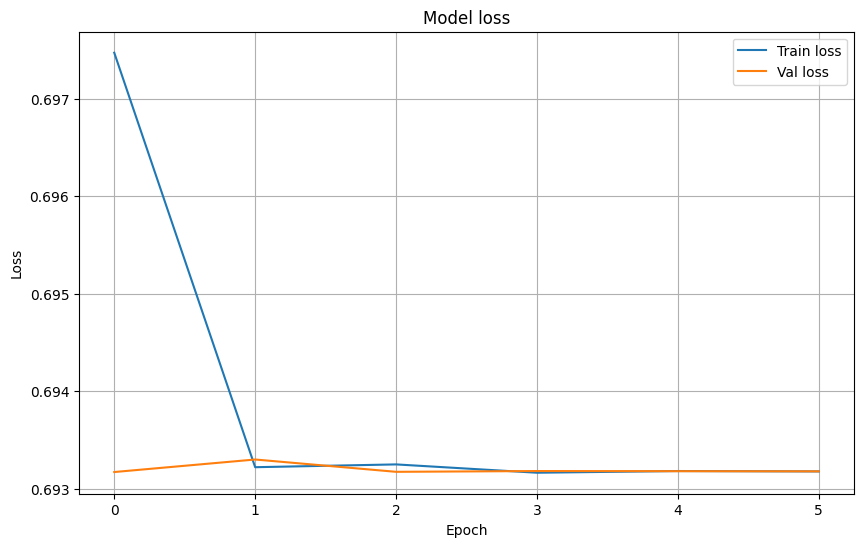

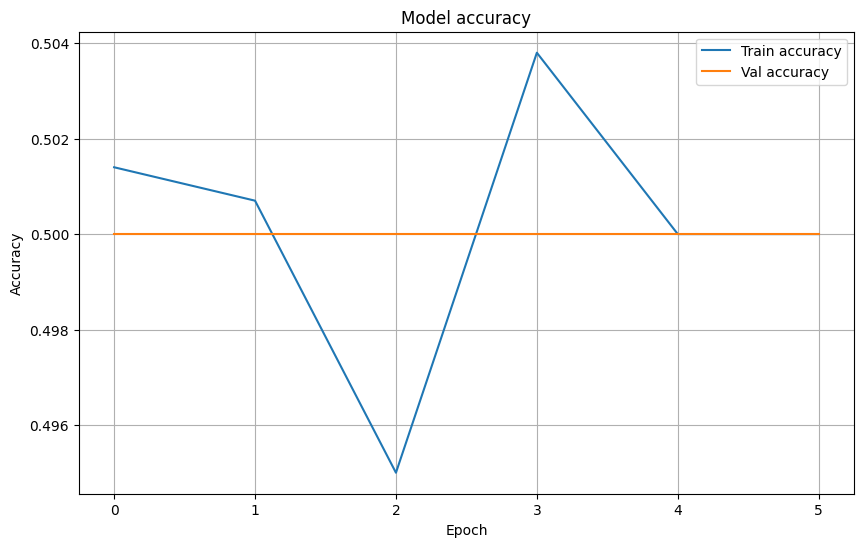

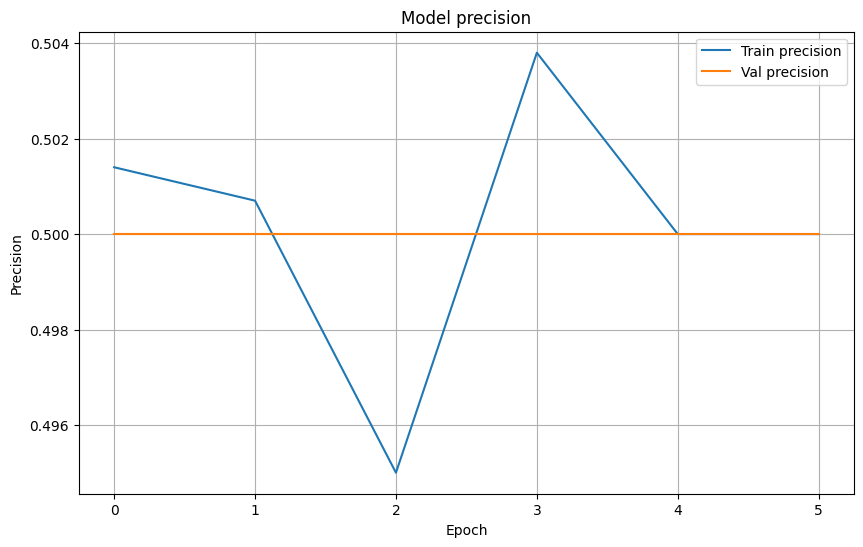

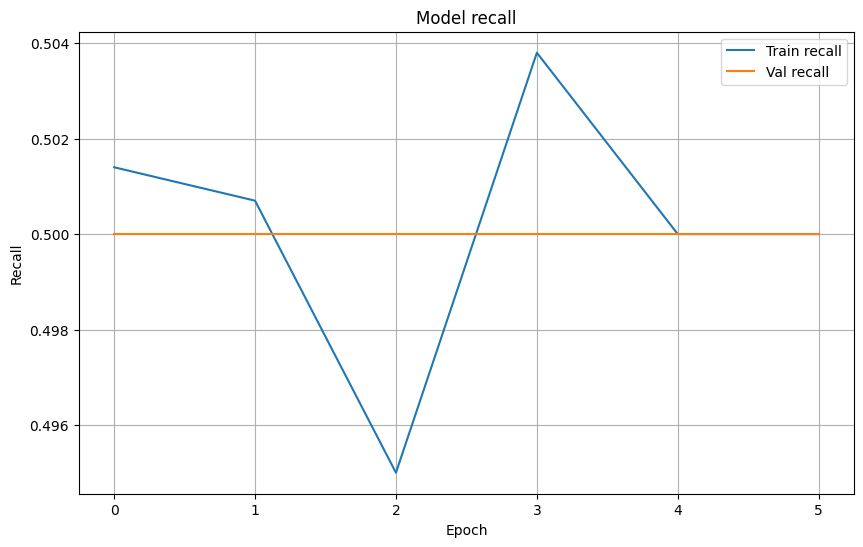

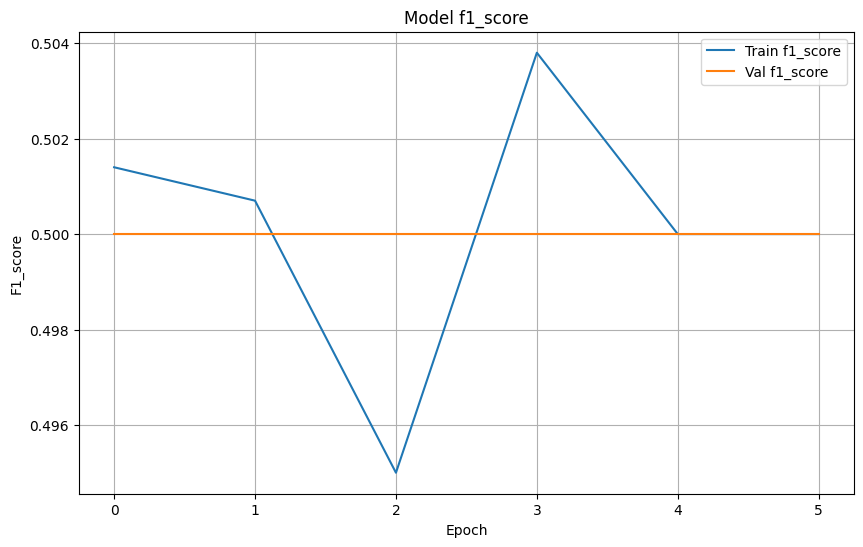

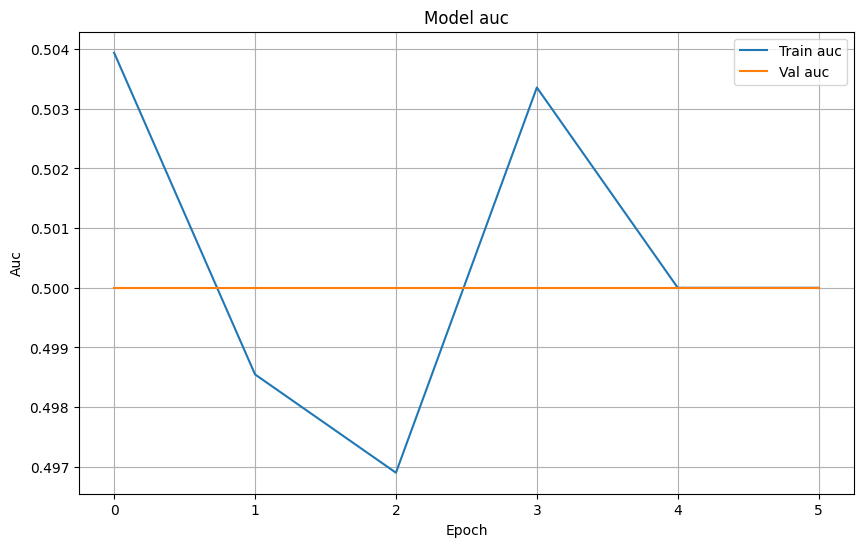

In [ ]:
# Listado de las métricas disponibles en el archivo CSV
metrics = ['loss', 'accuracy', 'precision', 'recall', 'f1_score', 'auc']

# Graficar las métricas
for metric in metrics:
    plt.figure(figsize=(10, 6))

    # Graficar el entrenamiento
    plt.plot(df[metric], label=f'Train {metric}')

    # Graficar la validación
    plt.plot(df[f'val_{metric}'], label=f'Val {metric}')

    # Etiquetas y título
    plt.title(f'Model {metric}')
    plt.xlabel('Epoch')
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.grid(True)
    plt.show()

- Predice imágenes

1/1 [==============================] - 0s 176ms/step
cat


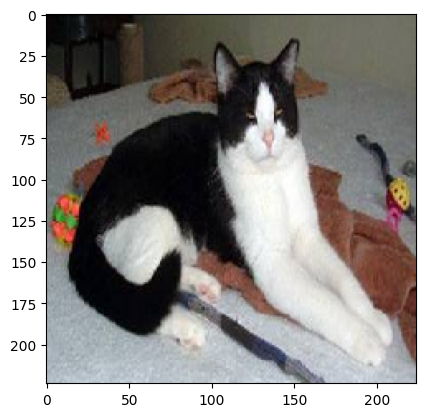

In [ ]:
img = image.load_img("/content/drive/MyDrive/Proyecto DogCat/test/test/20.jpg", target_size = (224, 224))
img = np.asarray(img)
plt.imshow(img)
img = np.expand_dims(img, axis = 0)
output = model.predict(img)
if output[0][0] > output[0][1]:
    print("cat")
else:
    print("dog")

Optimización del modelo:

- Aumento de datos
- Transfer Learning

In [20]:
train_dir = '/content/drive/MyDrive/Proyecto DogCat/train'
validation_dir = '/content/drive/MyDrive/Proyecto DogCat/validation'
test_dir = '/content/drive/MyDrive/Proyecto DogCat/test'

# Aumentación de datos para el conjunto de entrenamiento
train_datagen = ImageDataGenerator(
    rescale=1./255
)

# Aumentación de datos para el conjunto de validación (solo normalización)
val_datagen = ImageDataGenerator(rescale=1./255)


# Cargar datos de entrenamiento con aumentación
train_data2 = train_datagen.flow_from_directory(
    train_dir,
    target_size=(200, 200),
    batch_size=32,
    class_mode='categorical'
)

# Cargar datos de validación (sin aumentación)
val_data2 = val_datagen.flow_from_directory(
    validation_dir,
    target_size=(200, 200),
    batch_size=32,
    class_mode='categorical'
)

test_data2 = val_datagen.flow_from_directory(
    test_dir,
    target_size = (200, 200),  # Redimensiona las imágenes a 200x200 píxeles
    batch_size = 32,
    class_mode= None,   # No hay etiquetas para el conjunto de prueba
    shuffle=False       # Importante para mantener el orden de las imágenes
    )


Found 20000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.
Found 12500 images belonging to 1 classes.


In [21]:
# Verificar el mapeo de clases
class_indices = train_data2.class_indices
print(class_indices)  # {'cat': 0, 'dog': 1}

{'cat': 0, 'dog': 1}


In [35]:
from keras.layers import Input # Input Layer
from keras.applications import DenseNet121 # Keras Application
from keras.layers import Dense # Dense Layer (Fully connected)
from keras.models import Model # Model Structure


input_shape=(224, 224, 3)

img_input = Input(shape=input_shape)
base_model = DenseNet121(include_top=False,
                         input_tensor=img_input,
                         input_shape=input_shape,
                         pooling="max",
                         weights='imagenet')
base_model.trainable = True

# Añadir la capa de salida para clasificación binaria
x = base_model.output
predictions = Dense(2,
                    activation="softmax",
                    name="predictions")(x)
model2 = Model(inputs=img_input,
              outputs=predictions)

In [32]:
base_model.summary()

Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_5[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']

In [38]:
# Compilar el modelo
model2.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall(), AUC()])

In [39]:
# Entrenar el modelo
model2.fit(train_data2,
          validation_data=val_data2,
          epochs=10,
          verbose=1,
          callbacks = [checkpoint, early, reduce_lr, tensorboard, csv_logger, metric_difference_monitor])

Epoch 1/10
625/625 [==============================] - ETA: 0s - loss: 0.2608 - accuracy: 0.9129 - precision: 0.9129 - recall: 0.9129 - auc: 0.9688 
Epoch 1: val_recall improved from -inf to 0.95080, saving model to /content/drive/MyDrive/Proyecto DogCat/TransferVgg16_2-DogCat.keras
Epoch 1 - Difference between train and validation recall: -0.037949979305267334
625/625 [==============================] - 13443s 21s/step - loss: 0.2608 - accuracy: 0.9129 - precision: 0.9129 - recall: 0.9129 - auc: 0.9688 - val_loss: 0.1290 - val_accuracy: 0.9508 - val_precision: 0.9508 - val_recall: 0.9508 - val_auc: 0.9913 - lr: 0.0010
Epoch 2/10
625/625 [==============================] - ETA: 0s - loss: 0.1034 - accuracy: 0.9599 - precision: 0.9599 - recall: 0.9599 - auc: 0.9931
Epoch 2: val_recall did not improve from 0.95080
Epoch 2 - Difference between train and validation recall: 0.034300029277801514
625/625 [==============================] - 123s 196ms/step - loss: 0.1034 - accuracy: 0.9599 - preci

In [41]:
predictions = model2.predict(test_data2)

391/391 [==============================] - 9962s 26s/step


In [42]:
predicted_labels = np.argmax(predictions, axis=1)

In [43]:
# Crear un DataFrame con las predicciones
data_pred = pd.DataFrame(predicted_labels, columns=['Predicted Label'])
data_pred.to_csv('/content/drive/MyDrive/Proyecto DogCat/Transfer-predictions.csv', index=False)

In [44]:
class_indices = train_data2.class_indices

class_names = {v: k for k, v in class_indices.items()}

# Reemplazar las etiquetas numéricas con nombres de clases
data_pred['Predicted Label'] = data_pred['Predicted Label'].apply(lambda x: class_names[x])

# Guardar las predicciones en un archivo CSV
data_pred.to_csv('/content/drive/MyDrive/Proyecto DogCat/Transfer-predictions.csv', index=False)

# Mostrar el conteo de cada categoría
print(data_pred['Predicted Label'].value_counts())

Predicted Label
dog    6285
cat    6215
Name: count, dtype: int64


In [45]:
# Cargar la extensión tensorboard
%load_ext tensorboard

In [46]:
%tensorboard --logdir /content/drive/MyDrive/Proyecto DogCat/logs

ERROR: Failed to launch TensorBoard (exited with 2).
Contents of stderr:
2024-05-31 20:55:42.069382: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-31 20:55:42.069458: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-31 20:55:42.071388: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-31 20:55:43.072579: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
usage: tensorboard [-h] [--helpfull] [--logdir PATH] [--logdir_spec PATH_SPEC] [--host ADDR]
                   [--bind_all] [--port PORT] [--reuse_port BOOL] [--load_f

In [48]:
# Cargar el archivo CSV con los registros de entrenamiento
df = pd.read_csv('/content/drive/MyDrive/Proyecto DogCat/DogCat-transfer-training.csv')
print(df)

   epoch  accuracy       auc      loss       lr  precision   recall  \
0      0   0.91285  0.968806  0.260768  0.00100    0.91285  0.91285   
1      1   0.95990  0.993105  0.103376  0.00100    0.95990  0.95990   
2      2   0.96935  0.995929  0.078716  0.00100    0.96935  0.96935   
3      3   0.97200  0.996608  0.070920  0.00100    0.97200  0.97200   
4      4   0.96830  0.996028  0.077698  0.00100    0.96830  0.96830   
5      5   0.96745  0.995353  0.083274  0.00100    0.96745  0.96745   
6      6   0.96940  0.995903  0.079225  0.00100    0.96940  0.96940   
7      7   0.98230  0.998606  0.045632  0.00100    0.98230  0.98230   
8      8   0.98705  0.999212  0.037020  0.00001    0.98705  0.98705   
9      9   0.99260  0.999735  0.024420  0.00001    0.99260  0.99260   

   val_accuracy   val_auc  val_loss  val_precision  val_recall  
0        0.9508  0.991265  0.129003         0.9508      0.9508  
1        0.9256  0.980883  0.178110         0.9256      0.9256  
2        0.9484  0.9915

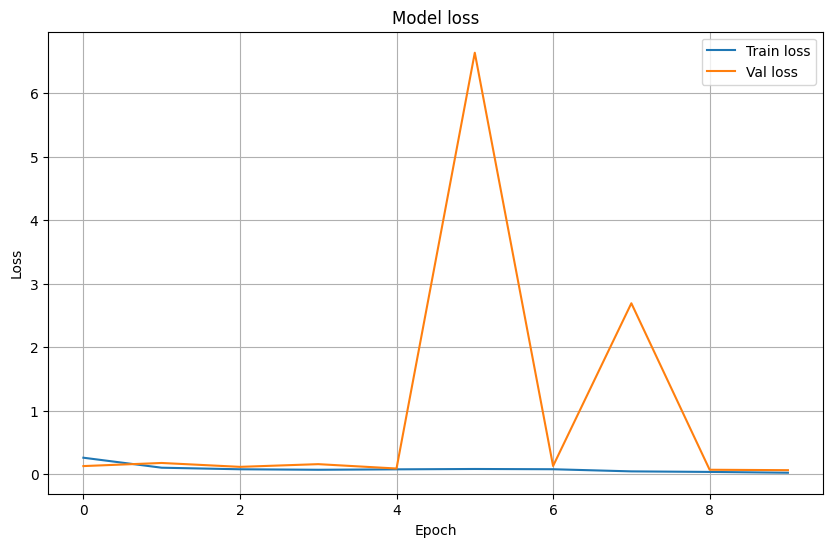

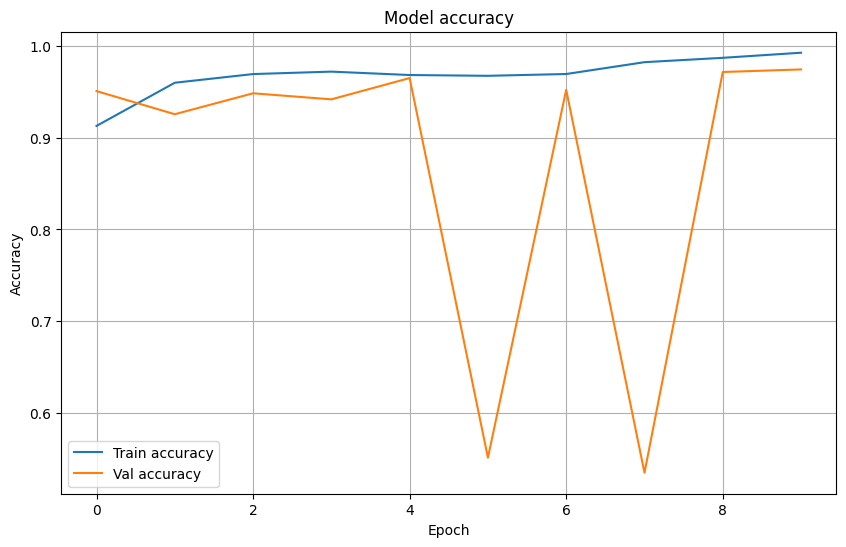

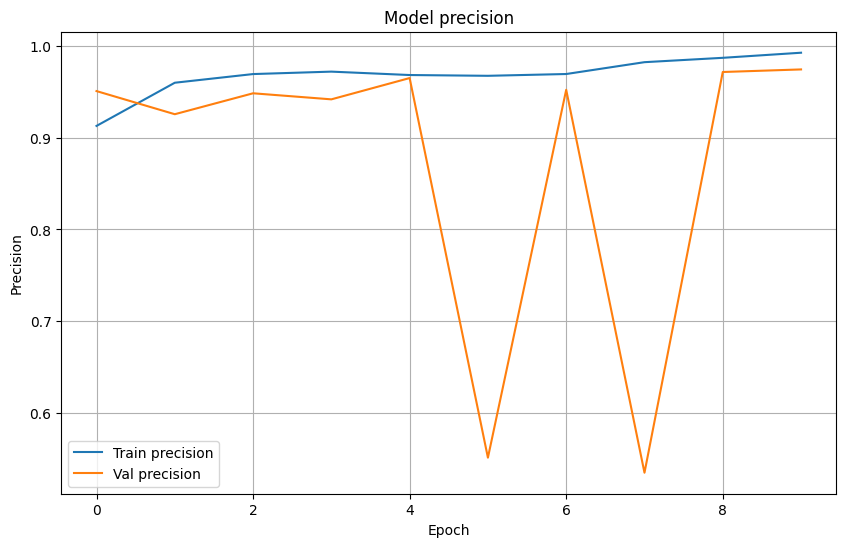

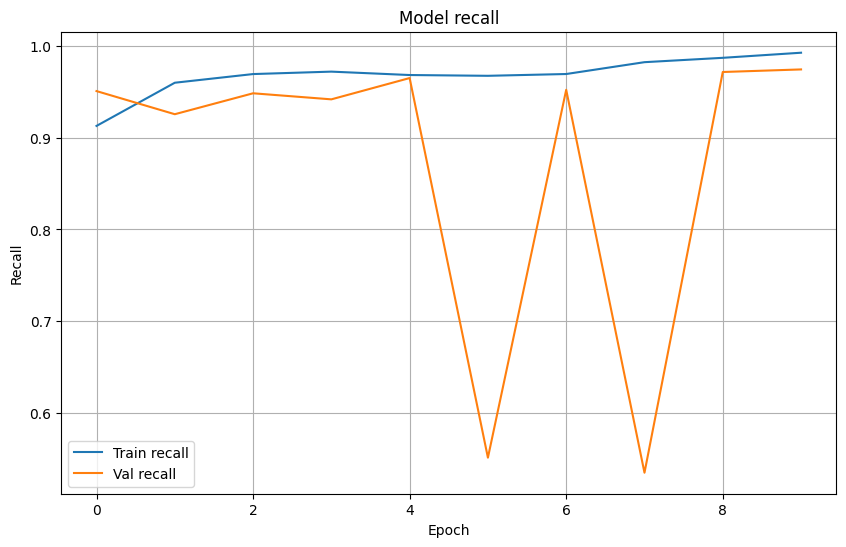

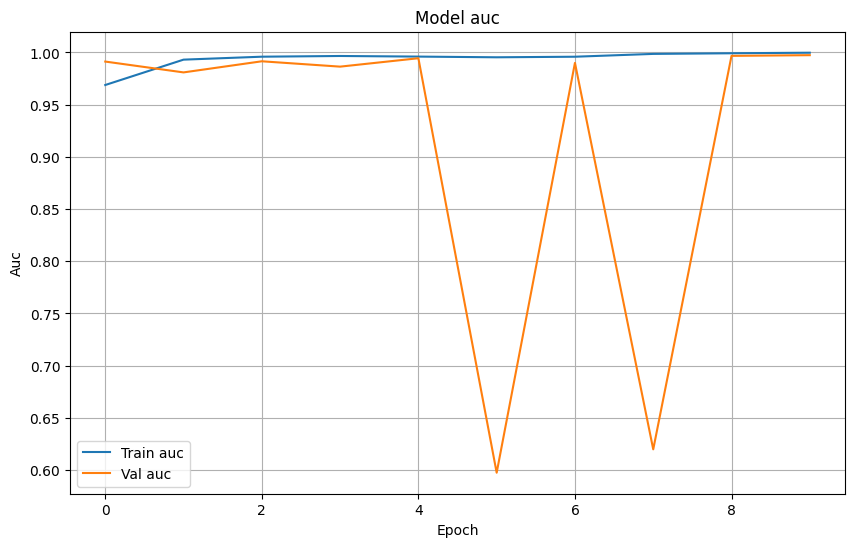

In [50]:
# Listado de las métricas disponibles en el archivo CSV
metrics = ['loss', 'accuracy', 'precision', 'recall', 'auc']

# Graficar las métricas
for metric in metrics:
    plt.figure(figsize=(10, 6))

    # Graficar el entrenamiento
    plt.plot(df[metric], label=f'Train {metric}')

    # Graficar la validación
    plt.plot(df[f'val_{metric}'], label=f'Val {metric}')

    # Etiquetas y título
    plt.title(f'Model {metric}')
    plt.xlabel('Epoch')
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.grid(True)
    plt.show()

1/1 [==============================] - 0s 34ms/step
cat


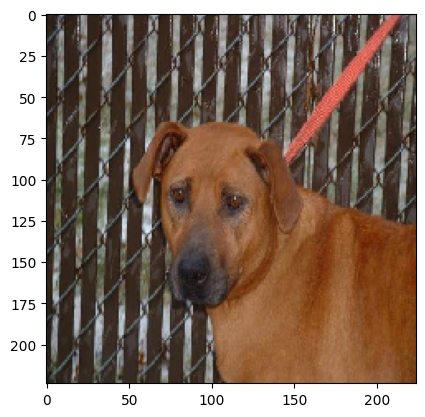

In [60]:
img = image.load_img("/content/drive/MyDrive/Proyecto DogCat/test/test/8321.jpg", target_size = (224, 224))
img = np.asarray(img)
plt.imshow(img)
img = np.expand_dims(img, axis = 0)
output = model2.predict(img)
if output[0][0] > output[0][1]:
    print("cat")
else:
    print("dog")

1/1 [==============================] - 0s 31ms/step


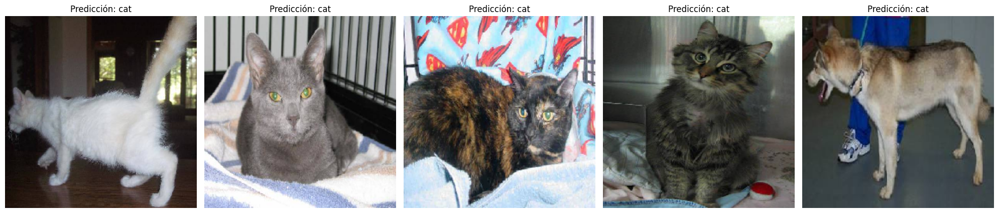

In [67]:
import numpy as np
import os
import random
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.resnet50 import preprocess_input
from keras.models import load_model

# Ruta a la carpeta de imágenes de prueba
test_images_folder = '/content/drive/MyDrive/Proyecto DogCat/test/test'

# Cargar el modelo entrenado
#model = load_model('ruta/al/modelo_entrenado.h5')

# Obtener una lista de todas las imágenes en la carpeta de prueba
test_images = os.listdir(test_images_folder)

# Verificar que haya suficientes imágenes en la carpeta de prueba
num_images_to_select = 5
if len(test_images) < num_images_to_select:
    raise ValueError(f"No hay suficientes imágenes en la carpeta de prueba. Se necesitan al menos {num_images_to_select} imágenes.")

# Seleccionar 5 imágenes aleatorias
random_images = random.sample(test_images, num_images_to_select)

# Preprocesar las imágenes, hacer predicciones y visualizar
fig, axes = plt.subplots(1, num_images_to_select, figsize=(20, 5))

for i, img_name in enumerate(random_images):
    try:
        # Ruta completa a la imagen
        img_path = os.path.join(test_images_folder, img_name)

        # Cargar la imagen y redimensionarla a 224x224 píxeles
        img = load_img(img_path, target_size=(224, 224))

        # Convertir la imagen a un array de numpy
        img_array = img_to_array(img)

        # Expandir las dimensiones para que sea compatible con el modelo
        img_array = np.expand_dims(img_array, axis=0)

        # Preprocesar la imagen (igual que se hizo para el entrenamiento)
        img_array = preprocess_input(img_array)

        # Hacer la predicción
        prediction = model2.predict(img_array)

        # Obtener la clase predicha (0: gato, 1: perro)
        predicted_class = np.argmax(prediction, axis=1)[0]

        # Mostrar el resultado
        class_name = 'dog' if predicted_class == 1 else 'cat'

        # Visualizar la imagen y la predicción
        axes[i].imshow(img)
        axes[i].set_title(f'Predicción: {class_name}')
        axes[i].axis('off')

    except Exception as e:
        print(f"Error al procesar la imagen {img_name}: {e}")

plt.tight_layout()
plt.show()


